# Algoritmos Evolutivos 1 - Desafío Práctico

**Docente**: Esp. Ing. Miguel Augusto Azar

**Cohorte**: B52025

**Alumno**: Maximiliano Torti

In [1]:
import pandas as pd
import numpy as np
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = (20, 9)
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 20
plt.rcParams["axes.grid"] =True

## Mapa

La clase Map contiene métodos para graficar mapas, coordenadas, recorridos y calcular distancias entre puntos o calular la posición final luego de un movimiento.
Esta clase también permite obtener el fitness de una posición, que posee valor 1.0 cuando se encuentra en un camino válido (calles y avenidas) y 0.0 cuando se encuentra en una posición no válida (ejemplo centro de manzana o en el río). A la función fitness se le aplicó un efecto blur para que la transición entre valores 1.0 y 0.0 sea suave a medida que la posición se aleja de caminos válidos.

In [2]:
from utils.map import Map
from utils.video import Video

In [3]:
rosario_map_path = 'map/raw.png'
rosario_policy_path = 'map/Rosario_compress_blur.bmp'
calib_coord = [[ -32.95907 , -60.63112],[ -32.9486 , -60.71226],[ -32.87341 , -60.69889],[ -32.92526 , -60.66143]]
calib_bmp = [[ 1370 , 1258],[ 1212 , 215],[ 56, 386],[ 853, 867]]

work_map = Map(rosario_map_path,rosario_policy_path, calib_coord, calib_bmp)

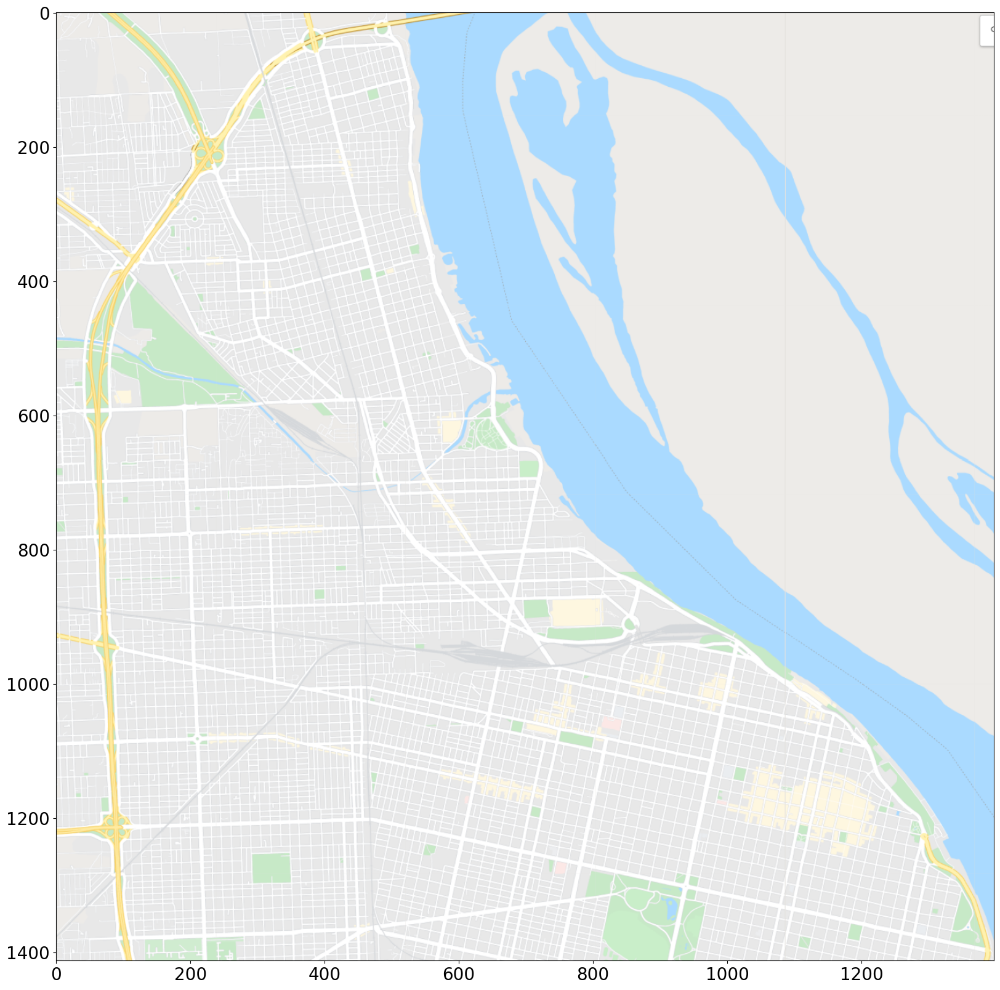

In [4]:
work_map.plot()

## Datos

Los datos utilizados fueron obtenidos con una aplicación de Tracking y un celular, contiene los valores de los sensores disponibles en el móvil por cada instante de tiempo. En este proyecto serán de interés la latitud y longitud inicial, y los valores de velocidad y ángulo de movimiento respecto al norte.

In [5]:
route_path = "data/SensorTracker.csv"
route = pd.read_csv(route_path, sep=",")

In [6]:
route.head()

,Unnamed: 0,Timestamp,Accel_x,Accel_y,Accel_z,Gyro_x,Gyro_y,Gyro_z,Light,Magnetic_x,Magnetic_y,Magnetic_z,Proximity,Latitude,Longitude,Elevation,Speed,Acceleration,Bearing
0,0,1.633986e+09,-0.348,-1.021,9.815,-0.003,-0.013,0.004,410.5,-47.831,18.263,-58.669,5.0,-32.95812,-60.63654,52.8,8.083333,-1.021,86.323690
1,1,1.633986e+09,0.049,-0.755,10.256,-0.005,0.028,-0.001,410.5,-48.469,15.900,-60.525,5.0,-32.95813,-60.63644,53.6,8.361111,-0.755,61.604633
2,2,1.633986e+09,-0.499,-1.013,9.925,-0.023,-0.014,-0.005,410.5,-48.975,18.281,-59.419,5.0,-32.95815,-60.63635,51.9,8.361111,-1.013,30.706606
3,3,1.633986e+09,-0.447,-0.975,10.309,-0.008,-0.013,0.019,372.5,-48.788,16.856,-58.800,5.0,-32.95816,-60.63627,51.2,8.111111,-0.975,82.547460
4,4,1.633986e+09,-0.504,-0.999,9.621,-0.008,-0.003,0.012,372.5,-50.456,19.406,-60.488,5.0,-32.95818,-60.63618,50.6,7.750000,-0.999,88.920540


## Particula

Para poder realizar una simulación de recorrido se utilizará la clase Particle, que contiene métodos para ejecutar pasos de los datos de rutas cargados y también contiene métodos para ejecutar el algoritmo evolutivo PSO.

In [7]:
from utils.particle import Particle

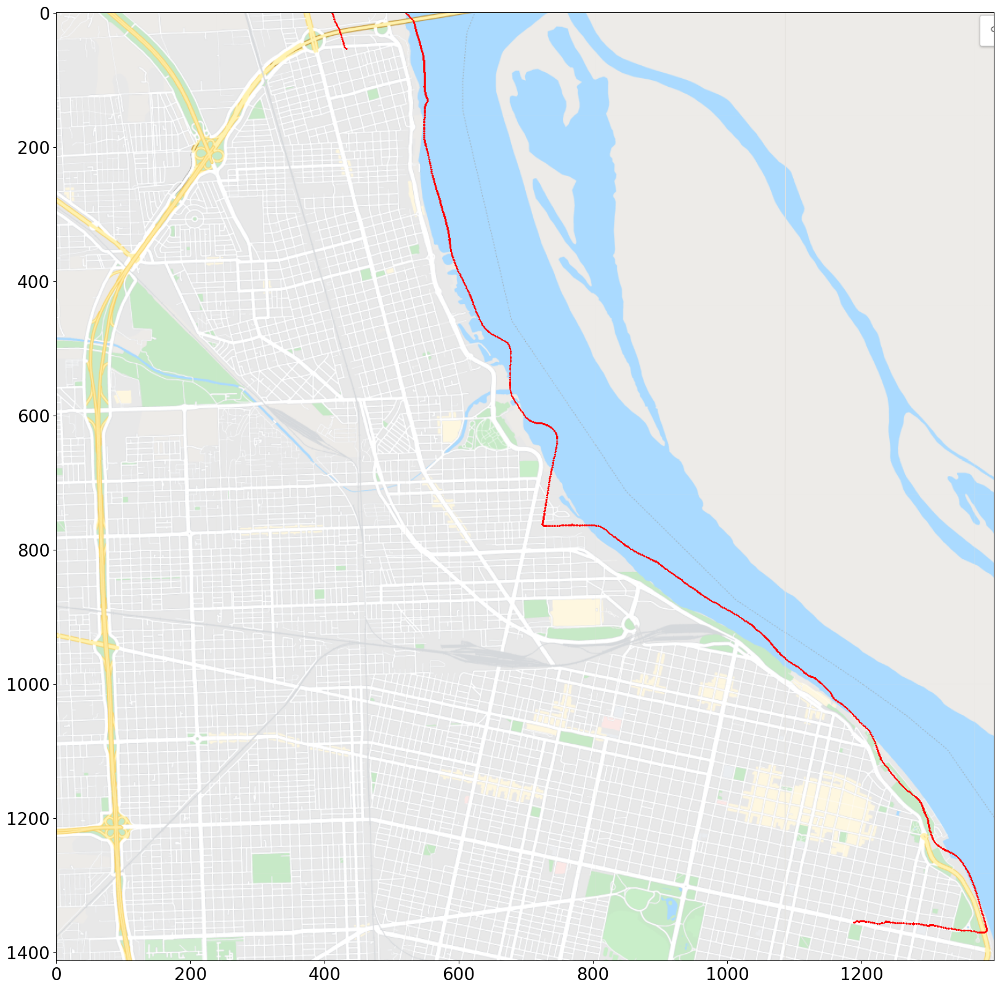

In [8]:
particle = Particle((route['Latitude'].iloc[0], route['Longitude'].iloc[0]), list(route['Speed']), list(route['Bearing']), work_map)

while not particle.is_finished():
    particle.move()
    particle.save_pos()

work_map.plot(particle.pos_history)

Se observa que al ejecutar los pasos de velocidad y ángulo de movimiento de los datos de ruta cargados, el camino obtenido se aleja notoriamente de las calles y caminos disponibles, lo cual indica que los sensores poseen un error considerable.

## Evolución con partículas y ruido superpuesto

Una forma de mejorar el camino anterior es crear muchas partículas y asignarle a cada una una copia de las series de tiempo de velocidad y ángulo de movimiento pero con un ruido reducido superpuesto. De esta forma, las diferentes partículas tendran un movimiento ligeramente diferente al resto, y al finalizar la simulación podemos obtener la partícula con mejores movimientos, es decir, con movimientos que respetan la serie de tiempo original y se ajustan lo mejor posible a caminos válidos.
Para obtener la "mejor" partícula, se utiliza la función fitness mencionada previamente que mide la idoneidad de la posición. Esta función se calcula cada cierta cantidad de movimientos y se acumula para obtener un fitness global al finalizar la simulación.

In [9]:
max_particles = 500
min_distance_update = 50

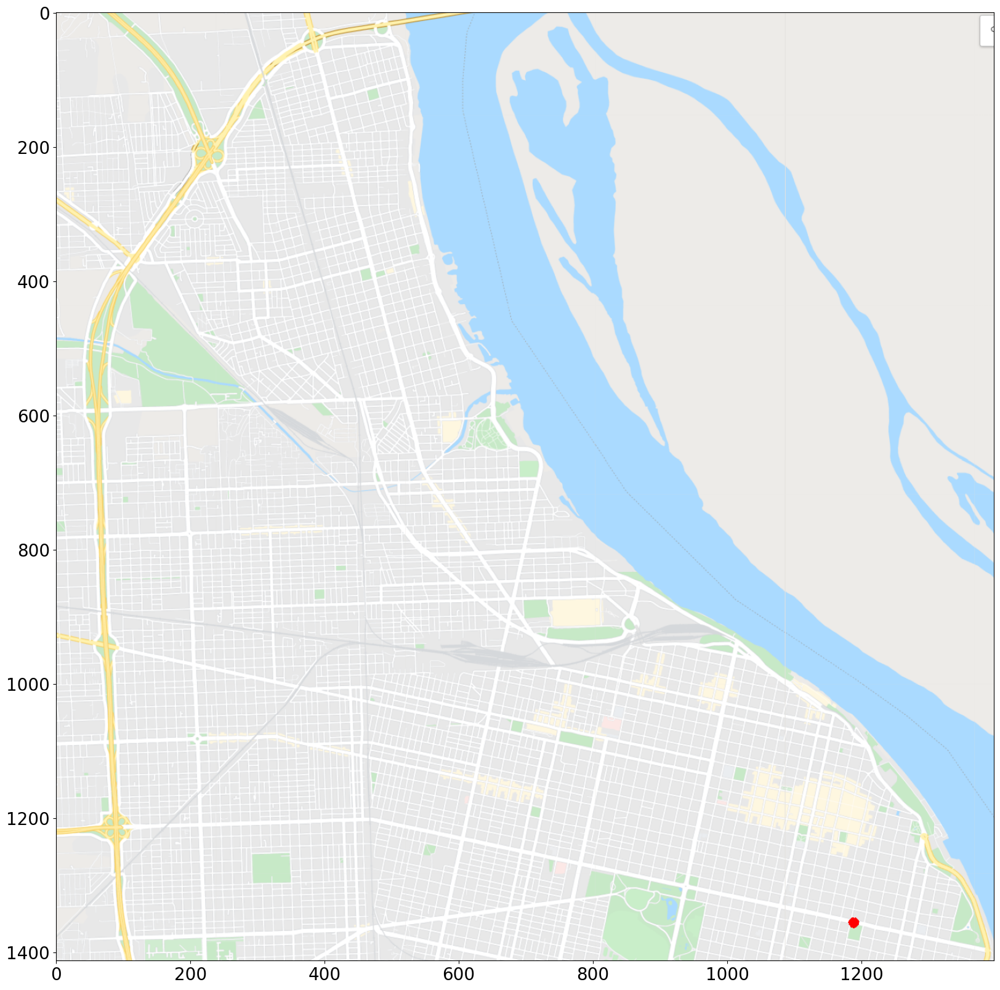

In [10]:
points_initial_coord = []
coord_0 = (route['Latitude'].iloc[0], route['Longitude'].iloc[0])
coord_0_noise_distance = np.random.uniform(0, 50, size=max_particles)
coord_0_noise_bearing = np.random.uniform(-180, 180, size=max_particles)

for i in range(max_particles):
    points_initial_coord.append(Map.destination_point(coord_0[0], coord_0[1], coord_0_noise_distance[i], coord_0_noise_bearing[i]))

np.random.shuffle(points_initial_coord)
work_map.plot(points_initial_coord)

In [11]:
population = []
speed = np.array(route['Speed'])
speed = speed[0:len(speed)]
bearing = np.array(route['Bearing'])
bearing = bearing[0:len(bearing)]

for init_coord in points_initial_coord:
    normal_noise_speed = speed + 0.5 * abs(speed) * np.random.normal(0,1,len(speed))
    normal_noise_bearing = bearing +  5 * np.random.normal(0, 1,len(bearing))
    particle = Particle(init_coord, list(normal_noise_speed), list(normal_noise_bearing), work_map)
    population.append(particle)

In [12]:
movement = 0
total_movements = len(speed)
epoch = 1
all_particles_fitness_history = []
max_particle_fitness_history = []

evolution_video = Video("results/evolution.mp4", work_map.get_shape())

while movement < total_movements:
    # Particles evolution
    for particle in population:
        particle.reset_cumulative_distance()
    while movement < total_movements and population[0].get_cumulative_distance() < min_distance_update:
        for particle in population:
            particle.move()
        movement = movement + 1
        evolution_video.snapshot(work_map.get_plot([particle.pos for particle in population]))

    # Save position
    for particle in population:
        particle.save_pos()

    # Calculate metrics
    max_particle_fitness = max([sum(particle.fitness_history) for particle in population])
    max_particle_fitness_history.append(max_particle_fitness)
    all_particles_fitness = sum([sum(particle.fitness_history) for particle in population])
    all_particles_fitness_history.append(all_particles_fitness)

    # Print results
    print(f"Epoch:{epoch} | All Particles Fitness (Cumulative/Avg) = {all_particles_fitness:.2f} / {(all_particles_fitness/epoch):.2f}"\
        f" | Max Particle Fitness (Cumulative/Avg) = {max_particle_fitness:.2f} / {(max_particle_fitness/epoch):.2f}")
    epoch = epoch + 1
    
evolution_video.stop()

Epoch:1 | All Particles Fitness (Cumulative/Avg) = 417.27 / 417.27 | Max Particle Fitness (Cumulative/Avg) = 1.00 / 1.00
Epoch:2 | All Particles Fitness (Cumulative/Avg) = 835.33 / 417.67 | Max Particle Fitness (Cumulative/Avg) = 2.00 / 1.00
Epoch:3 | All Particles Fitness (Cumulative/Avg) = 1120.12 / 373.37 | Max Particle Fitness (Cumulative/Avg) = 3.00 / 1.00
Epoch:4 | All Particles Fitness (Cumulative/Avg) = 1487.65 / 371.91 | Max Particle Fitness (Cumulative/Avg) = 4.00 / 1.00
Epoch:5 | All Particles Fitness (Cumulative/Avg) = 1731.51 / 346.30 | Max Particle Fitness (Cumulative/Avg) = 5.00 / 1.00
Epoch:6 | All Particles Fitness (Cumulative/Avg) = 1856.06 / 309.34 | Max Particle Fitness (Cumulative/Avg) = 6.00 / 1.00
Epoch:7 | All Particles Fitness (Cumulative/Avg) = 2082.76 / 297.54 | Max Particle Fitness (Cumulative/Avg) = 7.00 / 1.00
Epoch:8 | All Particles Fitness (Cumulative/Avg) = 2303.75 / 287.97 | Max Particle Fitness (Cumulative/Avg) = 7.72 / 0.96
Epoch:9 | All Particles Fi

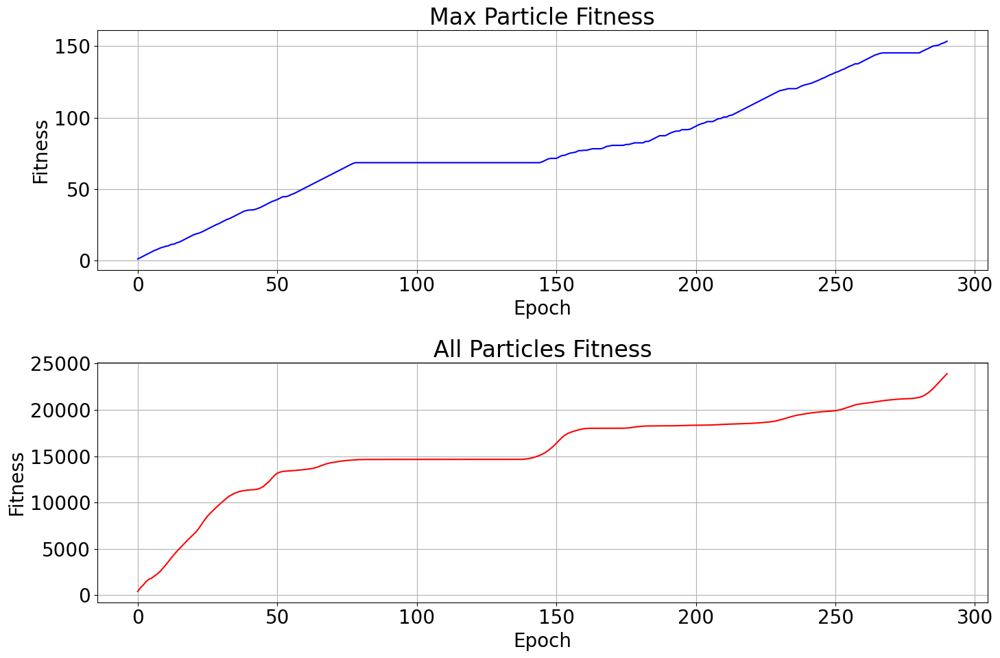

In [13]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1.plot(max_particle_fitness_history, color='blue')
ax1.set_title('Max Particle Fitness')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Fitness')

ax2.plot(all_particles_fitness_history, color='red')
ax2.set_title('All Particles Fitness')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Fitness')

plt.tight_layout()
plt.show()

De la gráfica de la función de fitness se observa que la mejor partícula obtuvo un puntaje de 153 (el mayor valor posible sería de 291 que son la cantidad de pasos posibles). Se observa que hay momventos donde el fitness crece casi linealmente, lo que indica que se está siguiendo un camino válido, pero en otros momentos el fitness se estanca completamente (la partícula se mueve por zonas inválidas).

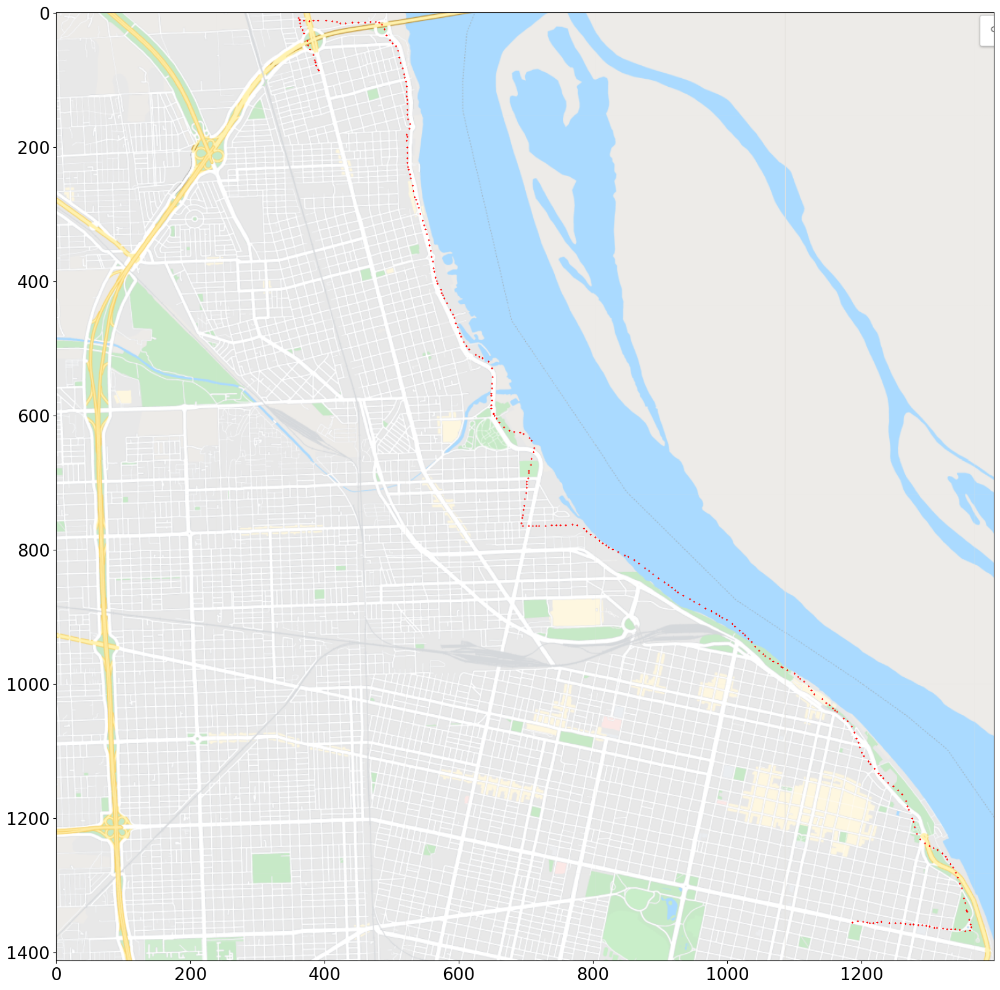

In [14]:
best_particle=np.argsort([sum(particle.fitness_history) for particle in population])[-1]
work_map.plot(population[best_particle].pos_history)

La gráfica del recorrido coincide con lo evaluado en la gráfica de la función fitness.

## Evolución con PSO

Con el fin de lograr mejores resultados, al caso anterior podemos agregar, cada cierto número de evoluciones (por ejempo cada 50 metros de movimiento), una instancia de n cantidad de épocas de PSO para que cada partícula se ajuste a la mejor posición encontrada por si misma y por la mejor partícula hasta el momento. 
Esto debería mejorar el ajuste y lograr un fitness promedio y máximo superior al caso anterior, mientras que respeta la serie de tiempo de velocidad y ángulo de movimiento original.

In [15]:
max_particles = 500
min_distance_update = 50
pso_epochs = 30

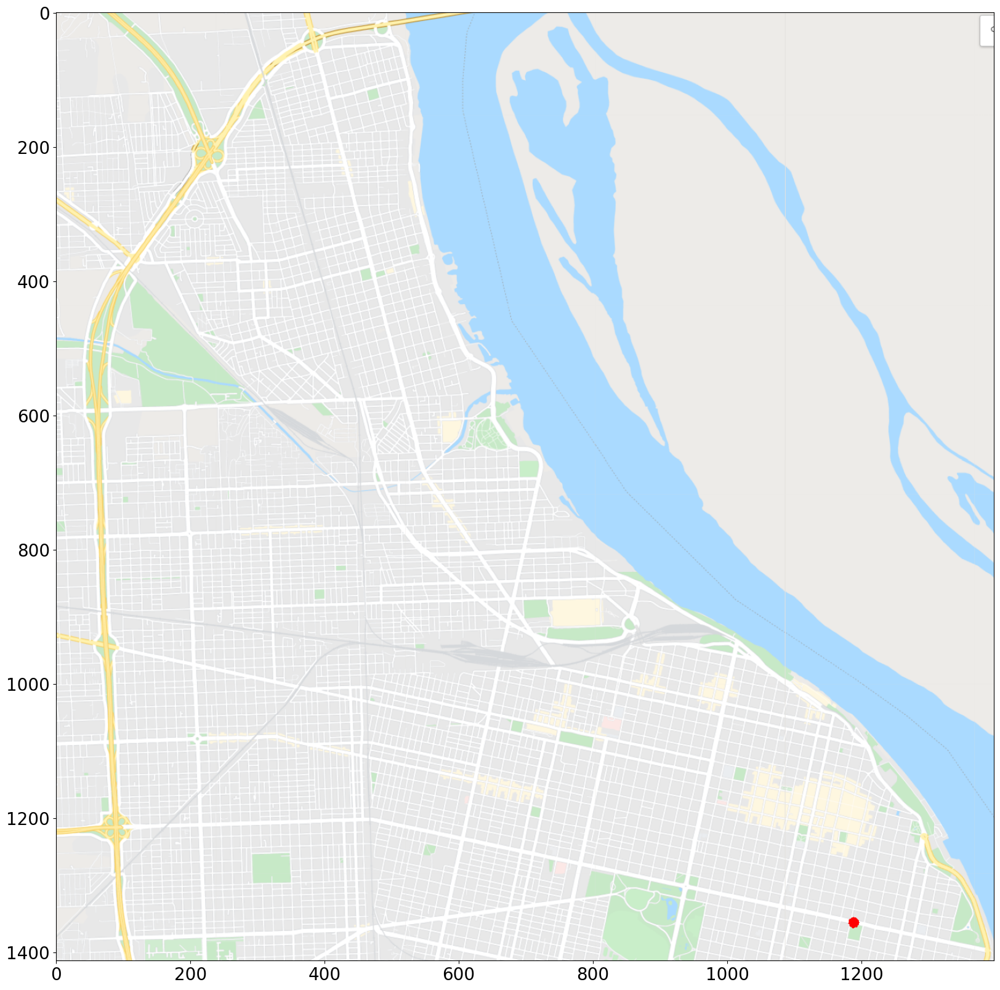

In [16]:
points_initial_coord = []
coord_0 = (route['Latitude'].iloc[0], route['Longitude'].iloc[0])
coord_0_noise_distance = np.random.uniform(0, 50, size=max_particles)
coord_0_noise_bearing = np.random.uniform(-180, 180, size=max_particles)

for i in range(max_particles):
    points_initial_coord.append(Map.destination_point(coord_0[0], coord_0[1], coord_0_noise_distance[i], coord_0_noise_bearing[i]))

np.random.shuffle(points_initial_coord)
work_map.plot(points_initial_coord)

In [17]:
population = []
speed = np.array(route['Speed'])
speed = speed[0:len(speed)]
bearing = np.array(route['Bearing'])
bearing = bearing[0:len(bearing)]

for init_coord in points_initial_coord:
    normal_noise_speed = speed + 0.5 * abs(speed) * np.random.normal(0,1,len(speed))
    normal_noise_bearing = bearing +  5 * np.random.normal(0, 1,len(bearing))
    particle = Particle(init_coord, list(normal_noise_speed), list(normal_noise_bearing), work_map)
    population.append(particle)

In [18]:
movement = 0
total_movements = len(speed)
epoch = 1
total_pso_fitness = []
all_particles_fitness_history = []
max_particle_fitness_history = []


evolution_video = Video("results/pso.mp4", work_map.get_shape())

while movement < total_movements:
    # Step 1 particle movement
    for particle in population:
        particle.reset_cumulative_distance()
    while movement < total_movements and population[0].get_cumulative_distance() < min_distance_update:
        for particle in population:
            particle.move()
        movement = movement + 1
        evolution_video.snapshot(work_map.get_plot([particle.pos for particle in population]))
    
    # Step 2 PSO
    epoch_pso_fitness = []
    for particle in population:
        particle.pso_start()
    epoch_pso_fitness.append([particle.last_pso_fitness for particle in population])
    for _ in range(pso_epochs):
        gbest_particle = population[np.argsort([particle.best_pso_fitness for particle in population])[-1]]
        gbest_pos = gbest_particle.pbest
        gbest_fitness = gbest_particle.best_pso_fitness
        for particle in population:
            particle.pso_move(gbest_pos, gbest_fitness)
        for particle in population:
            particle.pso_evaluate()
        epoch_pso_fitness.append([particle.last_pso_fitness for particle in population])
        evolution_video.snapshot(work_map.get_plot([particle.pos for particle in population]))
        
    total_pso_fitness.append(epoch_pso_fitness)
    
    # Save best pos
    for particle in population:
        particle.pso_set_pbest()
        particle.save_pos()
    evolution_video.snapshot(work_map.get_plot([particle.pos for particle in population]))
    
    # Metrics
    max_particle_fitness = max([sum(particle.fitness_history) for particle in population])
    max_particle_fitness_history.append(max_particle_fitness)
    all_particles_fitness = sum([sum(particle.fitness_history) for particle in population])
    all_particles_fitness_history.append(all_particles_fitness)
    
    print(f"Epoch:{epoch} | All Particles Fitness (Cumulative/Avg) = {all_particles_fitness:.2f} / {(all_particles_fitness/epoch):.2f}"\
        f" | Max Particle Fitness (Cumulative/Avg) = {max_particle_fitness:.2f} / {(max_particle_fitness/epoch):.2f}")
    epoch = epoch + 1

evolution_video.stop()

Epoch:1 | All Particles Fitness (Cumulative/Avg) = 500.00 / 500.00 | Max Particle Fitness (Cumulative/Avg) = 1.00 / 1.00
Epoch:2 | All Particles Fitness (Cumulative/Avg) = 991.53 / 495.76 | Max Particle Fitness (Cumulative/Avg) = 2.00 / 1.00
Epoch:3 | All Particles Fitness (Cumulative/Avg) = 1491.53 / 497.18 | Max Particle Fitness (Cumulative/Avg) = 3.00 / 1.00
Epoch:4 | All Particles Fitness (Cumulative/Avg) = 1987.34 / 496.83 | Max Particle Fitness (Cumulative/Avg) = 4.00 / 1.00
Epoch:5 | All Particles Fitness (Cumulative/Avg) = 2487.34 / 497.47 | Max Particle Fitness (Cumulative/Avg) = 5.00 / 1.00
Epoch:6 | All Particles Fitness (Cumulative/Avg) = 2986.28 / 497.71 | Max Particle Fitness (Cumulative/Avg) = 6.00 / 1.00
Epoch:7 | All Particles Fitness (Cumulative/Avg) = 3483.70 / 497.67 | Max Particle Fitness (Cumulative/Avg) = 7.00 / 1.00
Epoch:8 | All Particles Fitness (Cumulative/Avg) = 3983.70 / 497.96 | Max Particle Fitness (Cumulative/Avg) = 8.00 / 1.00
Epoch:9 | All Particles Fi

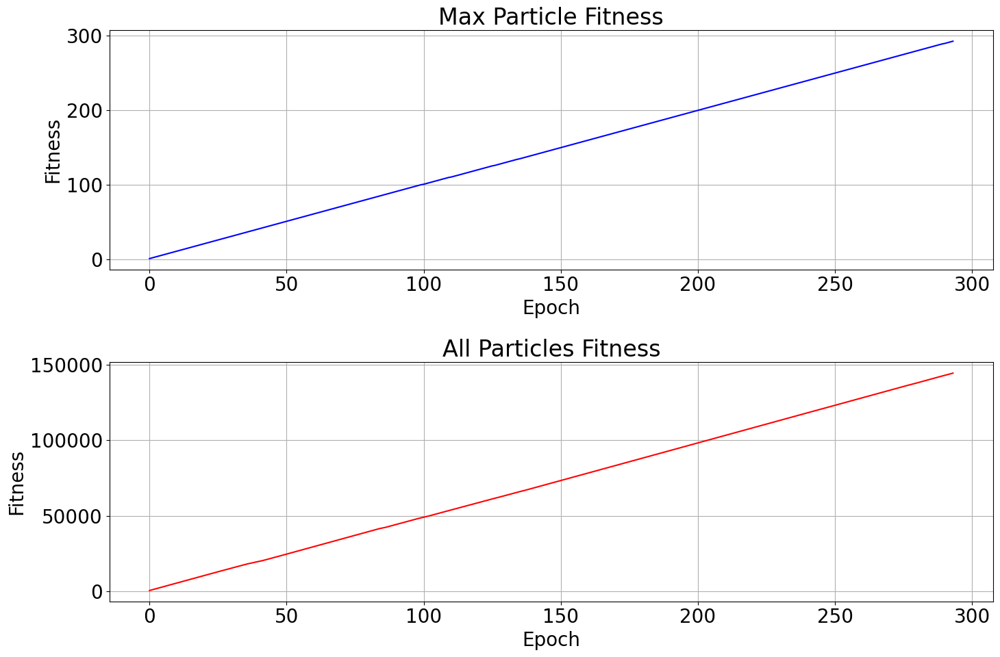

In [19]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1.plot(max_particle_fitness_history, color='blue')
ax1.set_title('Max Particle Fitness')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Fitness')

ax2.plot(all_particles_fitness_history, color='red')
ax2.set_title('All Particles Fitness')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Fitness')

plt.tight_layout()
plt.show()

En este caso se observa que ambas gráficas de la función de fitness crecen linealmente lo cual nos indica que no solamente la mejor partícula, sino que también todas las partículas, se desplazaron mayormente por zonas válidas.

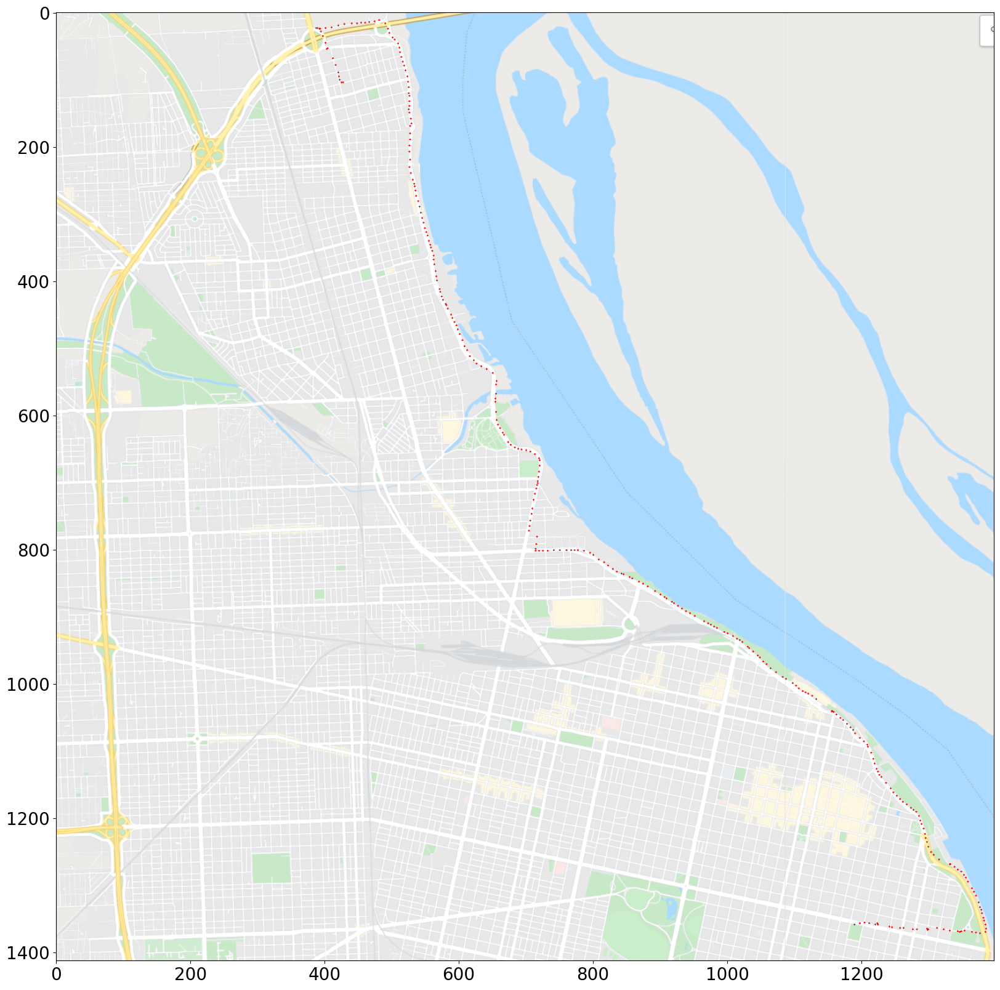

In [20]:
best_particle=np.argsort([sum(particle.fitness_history) for particle in population])[-1]
work_map.plot(population[best_particle].pos_history)

La gráfica de ruta de la mejor partícula confirma lo analizado sobre la gráfica de fitness

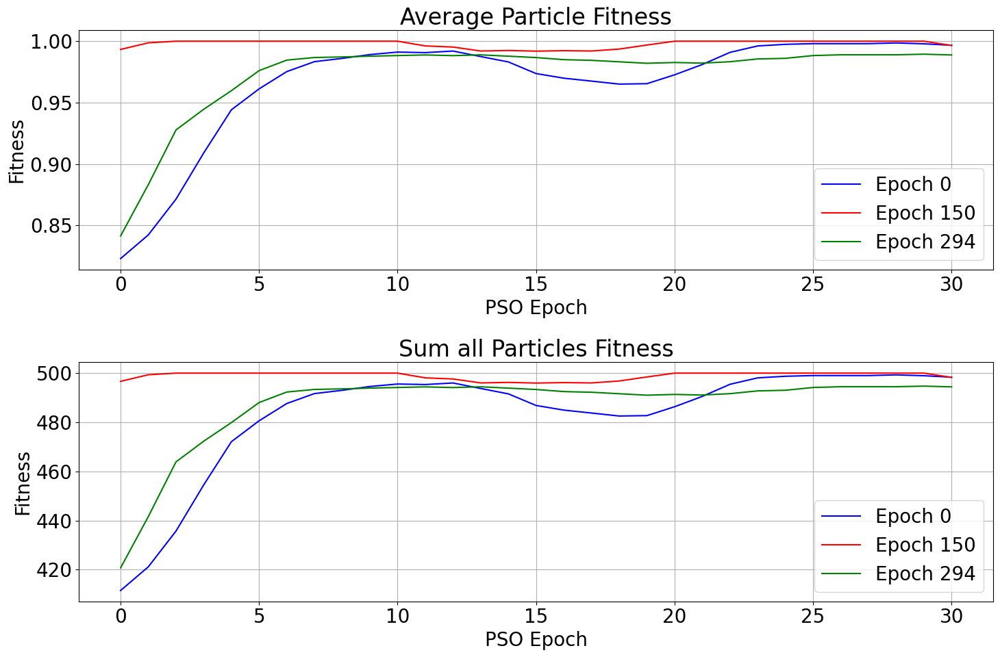

In [29]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1.plot([np.mean(particles_fitness) for particles_fitness in total_pso_fitness[0]], color='blue', label="Epoch 0")
ax1.plot([np.mean(particles_fitness) for particles_fitness in total_pso_fitness[150]], color='red', label="Epoch 150")
ax1.plot([np.mean(particles_fitness) for particles_fitness in total_pso_fitness[-1]], color='green', label=f"Epoch {len(total_pso_fitness)}")
ax1.set_title('Average Particle Fitness')
ax1.set_xlabel('PSO Epoch')
ax1.set_ylabel('Fitness')
ax1.legend()

ax2.plot([sum(particles_fitness) for particles_fitness in total_pso_fitness[0]], color='blue', label="Epoch 0")
ax2.plot([sum(particles_fitness) for particles_fitness in total_pso_fitness[150]], color='red', label="Epoch 150")
ax2.plot([sum(particles_fitness) for particles_fitness in total_pso_fitness[-1]], color='green', label=f"Epoch {len(total_pso_fitness)}")
ax2.set_title('Sum all Particles Fitness')
ax2.set_xlabel('PSO Epoch')
ax2.set_ylabel('Fitness')
ax2.legend()

plt.tight_layout()
plt.show()

La gráfica anterior muestra como evoluciona la función de fitness para las instancias de PSO ejecutadas al inicio de la simulación y luego de 150 y 294 épocas de movimientos de la serie de tiemppo. Se observa que en la época 150 las partículas ya comenzaron en posiciones válidas y la ejecución de PSO en este caso no tuvo efecto, pero para las ótras épocas, la ejecución de PSO mejoró notablemente el fitness alcanzado.

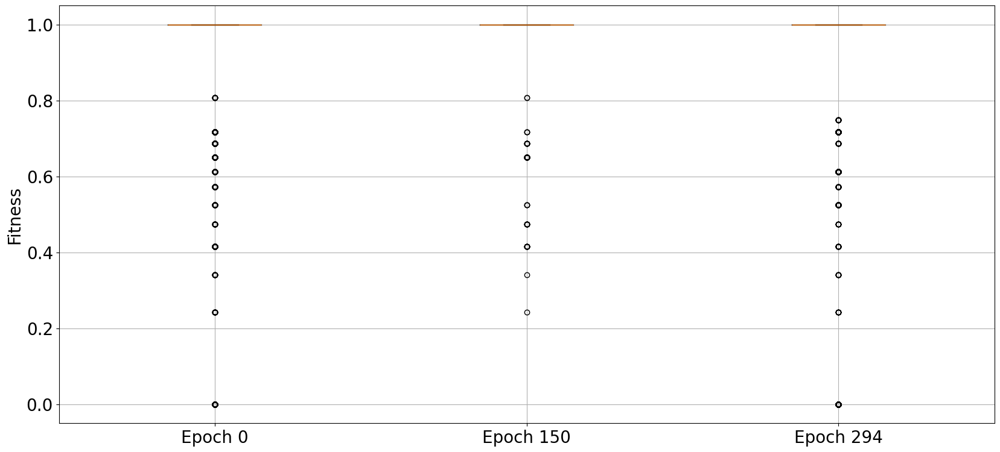

In [38]:
fig, ax = plt.subplots()
bplot = ax.boxplot([[particle_fitness for partciles_fitness in total_pso_fitness[0] for particle_fitness in partciles_fitness],
                    [particle_fitness for partciles_fitness in total_pso_fitness[150] for particle_fitness in partciles_fitness],
                    [particle_fitness for partciles_fitness in total_pso_fitness[-1] for particle_fitness in partciles_fitness]], 
                   tick_labels=["Epoch 0", "Epoch 150", f"Epoch {len(total_pso_fitness)}"]) 
ax.set_ylabel("Fitness")
plt.show()

Al realizar un gráfico de boxplot de 3 instancias completas de ejecución del algoritmo de PSO, se observa que el algoritmo es estable y preciso, con prácticamente toda la concentración de casos en 1.0 (máximo fitness que puede obtener una partícula para un instante o posición única) y la presencia de unos pocos outliers.